# Inference SALCT1
## 27 March 2020

Depth architectures seems to heavily employ the depth information in their predictions.
Looks at 45k fuse (green) and 40k rgbd (red) models, we see both networks produce very similar results, however, the RGBD model appears to be slightly better at isolating individual trees.

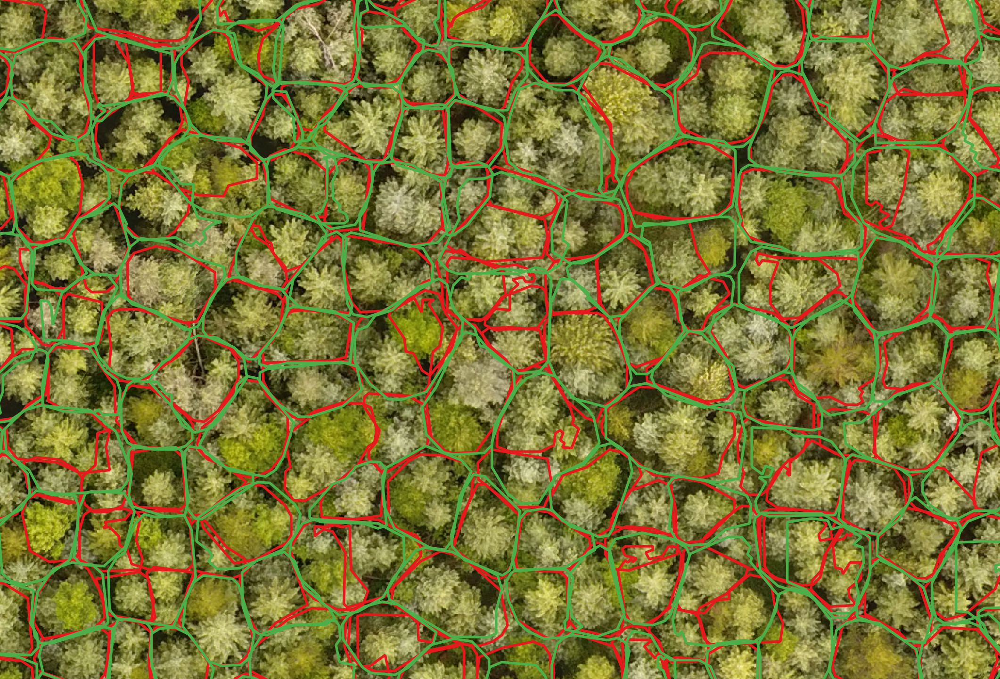

Looking at the CHM, we see the models are unable to differentiate between trees in very dense plots where the CHM looks smooth and homogeneous. In line with the assumption that the CHM helps the models identify where trees are, the model clearly picks out, if not clusters, where the trees are. However, it appears the most exhibits heavy reliance on the CHM, and fails to isolate individual trees further. Whether this is due to smoothend or imprecise CHM data, or poor data label quality that forces the model to become conservative by favoring CHM data as apposed to RGB data. This hypothesis is drawn from the fact that depth networks achieve better accuracy/loss, but the RGB predictions seem to be more fine grained. Although perhaps the depth models achieve better false negative accuracy, which could equally be a valid reason for their better metrics.  
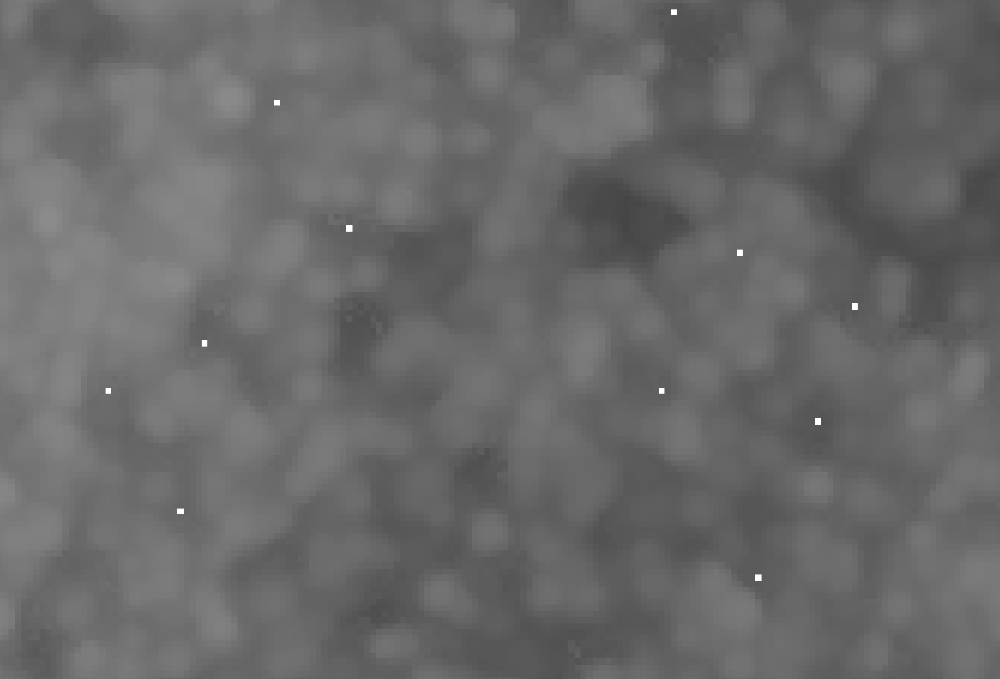

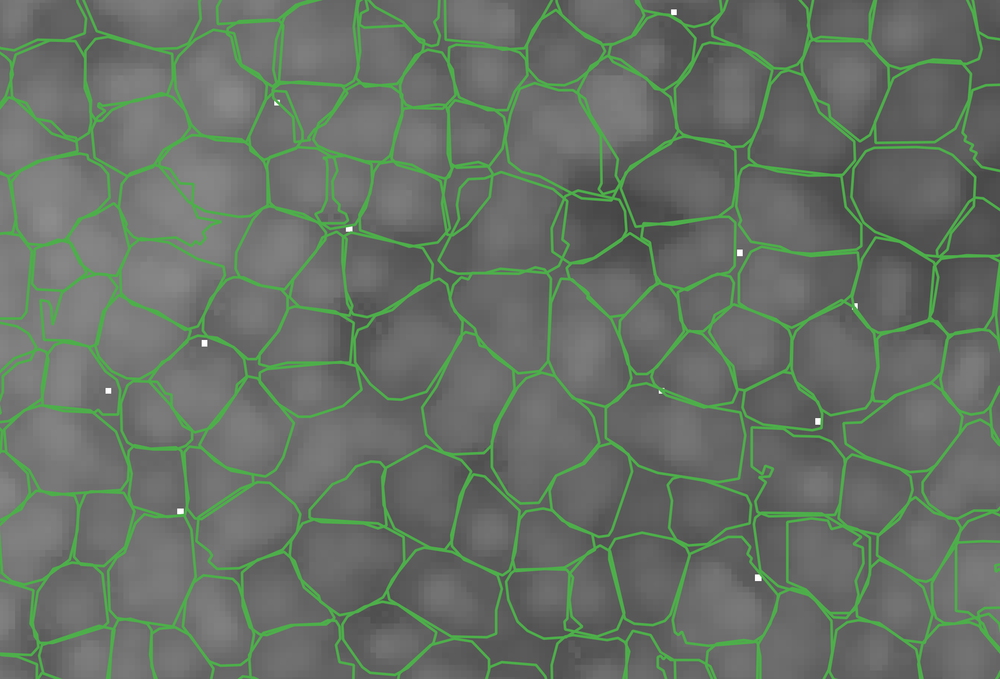

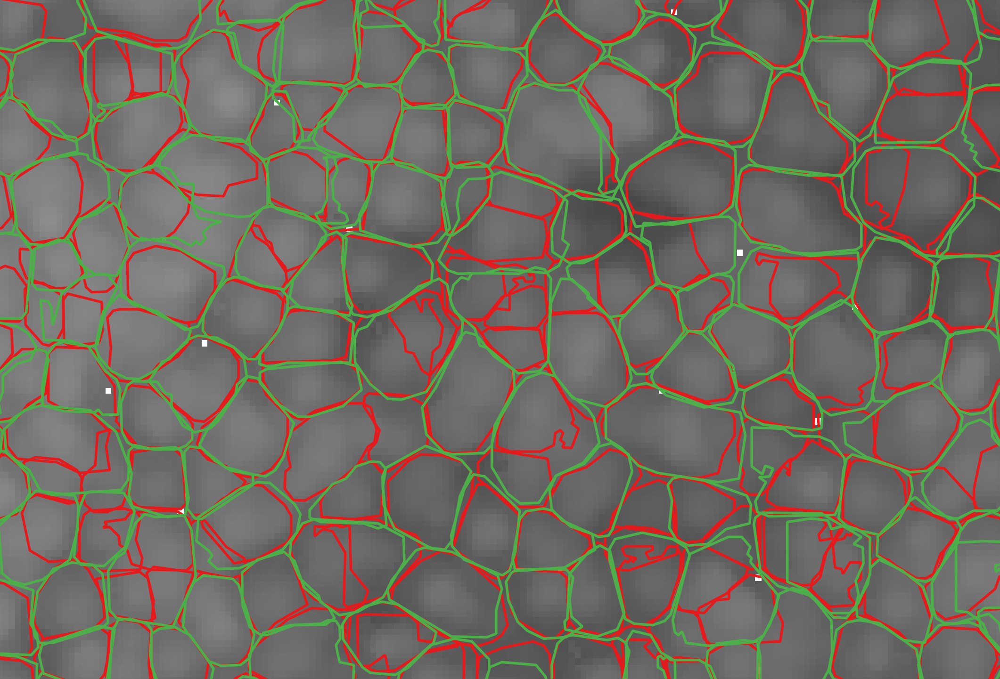

Looking at the 45k rgb model (orange), we see its predictions are even more localized.
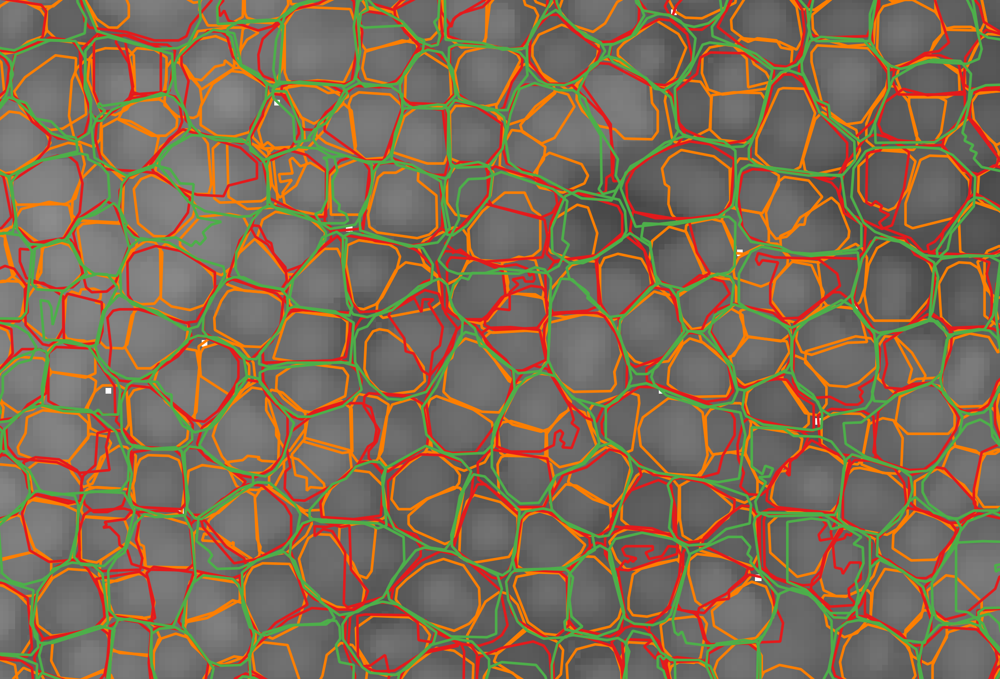

In line with the fact that RGB can better capture individual tress, perhaps with different shades of green based on their species, the RGB model outperforms the others on dense plots, where the CHM fails to capture the intricacies of the situation.
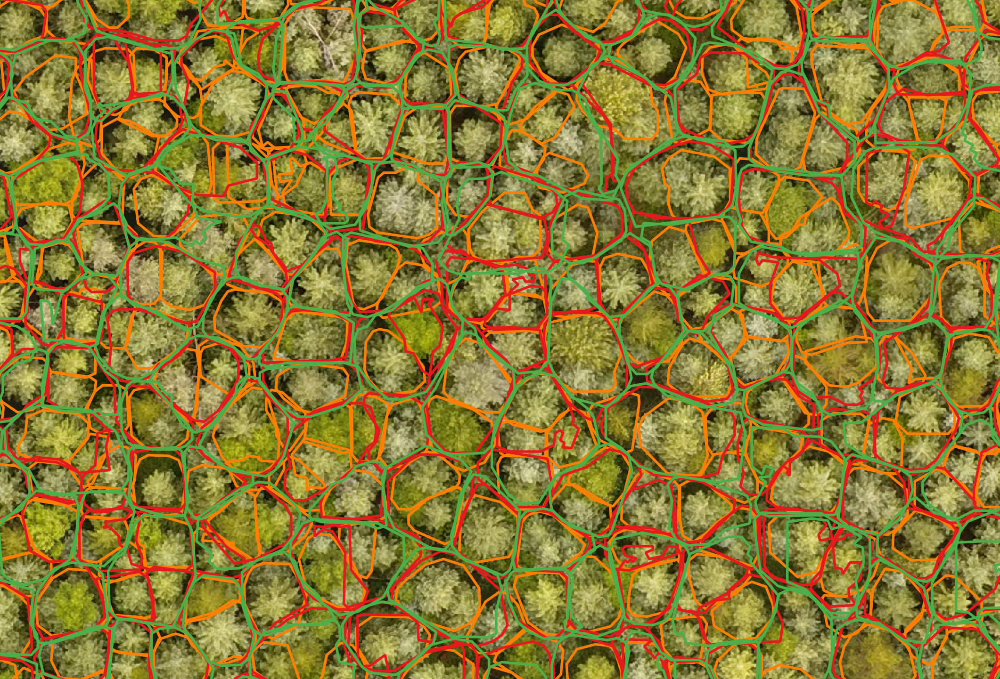

Another interesting observation is that the RGBD model makes predictions that lie somewhat inbetween the fuse and rgb models, which may suggest that the depth fusing model currently employed gives too much weight to the CHM.

The situation appears as so: dept models seem to generalize well on the CHM. For sparse plots, this means such models can be very reliable, independent of tree species, lanscape conditions etc. This was confirmed in the CPT2b notebook. However, for dense plots, whether branches are overlapping or the CHM data is too subtle to capture the separation of individual trees, depth models tend to overgeneralize and cluster multiple trees together. In these situations, the RGB models appear to perform better better by isolating more individual trees.

However one comparison between the fuse and rgb model is that the fuse mask prediction accuracy diverges considerably from that of the rgb model. This suggests that the generalized clustering mask produced by the fuse models is rewarded over the more fine grained, localized mask predictions of the rgb model.

We should check and see if the labelled data is clustering mutliple trees together into a single annotation.

We may then also expect then that the RGB model accuracy is bounded by such poor label quality: if ground truth labels are cluster a few trees rather than individual ones, the RGB predictions will result in a smaller IOU than the fuse model's so long as they remain fine grained/localized on individual trees.

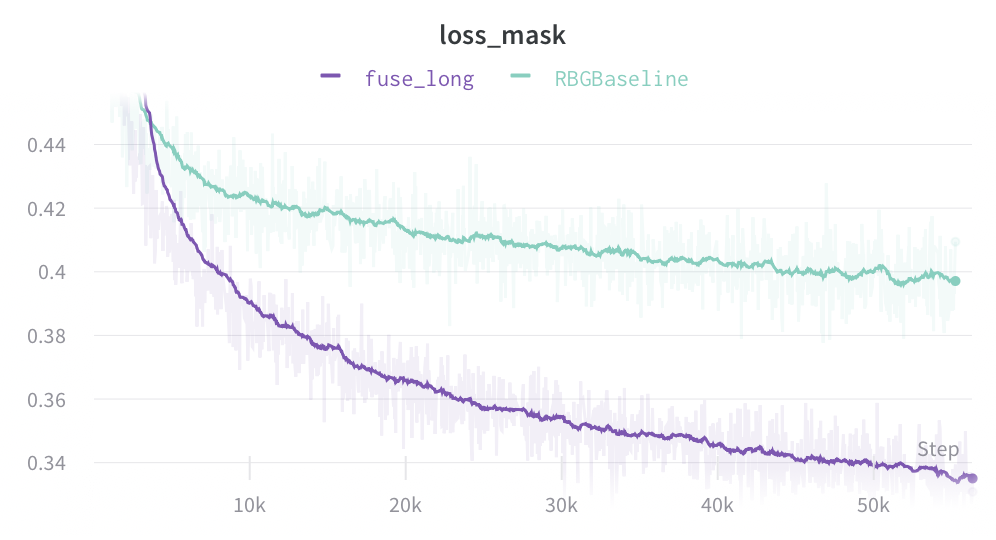

In [1]:
import shapefile

In [4]:
rgb45 = shapefile.Reader('../shapefiles/SALCT1/SALCT1_rgb45.shp')

In [5]:
fuse45 = shapefile.Reader('../shapefiles/SALCT1/SALCT1_fuse45.shp')

In [30]:
labels = shapefile.Reader('../../datasets/SALCT1/Segments/segs_simple.shp')

In [6]:
rgb_recs = rgb45.shapeRecords()

In [28]:
fuse_recs = fuse45.shapeRecords()

In [31]:
labels_recs =  labels.shapeRecords()

In [32]:
print(f'RGB # Predictions: {len(rgb_recs)}, FUSE # Predictions: {len(fuse_recs)}, Labels #: {len(labels_recs)}')

RGB # Predictions: 152371, FUSE # Predictions: 38652, Labels #: 77773


In [57]:
fuse_recs[101].record.polyArea ## This needs to be fixed

-0.0

Looking at the loss function further, a model is penalized for predicting when it should not have (false positive), not predicting when it should have (false negative), and over or under predicting. 

### False positives

For both models, 20% of predictions appear to be false positives, with not much discrepancy between them. This may suggest a bound for poor data quality, where trees that should have been segmented in the ground truth are actually not segmented. The slight discrepency between the two models suggests that incorporating depth helpd the fuse model avoid predicting random artifacts on the landscape.

### False negatives

A lower bound of this curve may suggest ground truth labels exists where trees do not, and hence neither model will make predictions there. Presumably both models also miss a certain portion of the trees that were correctly labelled. To what extend does each factor weigh in for the high limit, and how can we compare the discrepancy between the two models?

The RGB model predicts twice as many trees as the ground truth data and the fuse model predicts half as many as the ground truth data. Yet the fuse model has a lower false negative count. This may suggest that indeed the label quality is more characteristic of clustering, since the RGB predictions seems mostly accurate.

Further exploration of how many trees on average the fuse model cl

One explanation could be that the RGB model appea

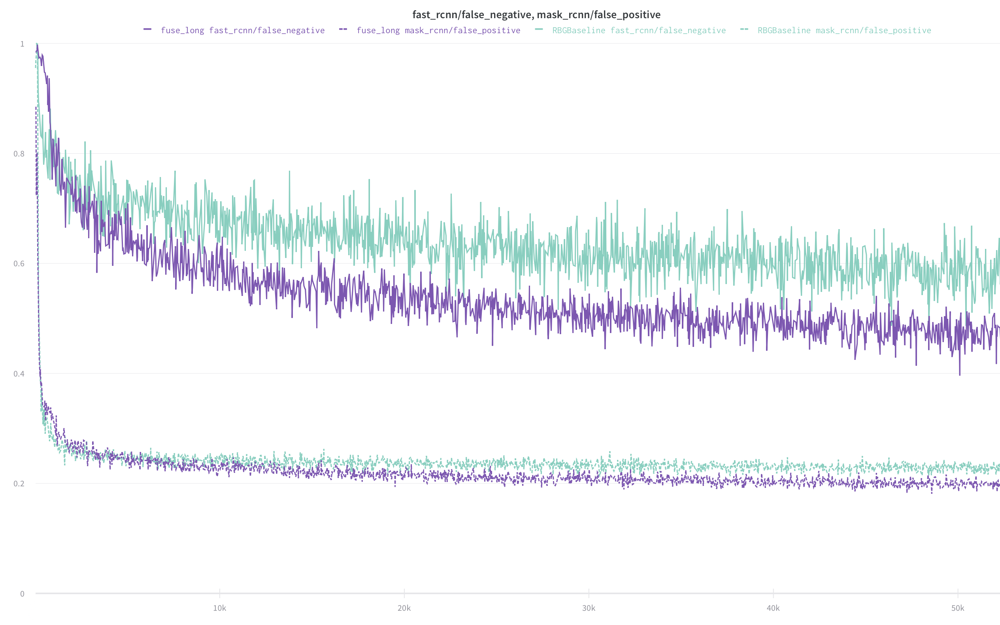